핸드폰 사용에 대한 일반적 패턴과 개인적 패턴 구분하기

개인적 패턴을 활용하여 personalized channel recommendation 모델 만들기 

## **🔸 DATA OVERVIEW**
- 스마트폰 앱/웹 로그 데이터셋
- Android 6.0.0 이상을 대상으로 UsageStat API를 활용해 수집된 앱 사용 내역
- 31명의 피험자를 대상으로 2018.10월-11월 중 약 3주간 수집됨, 약 158만 건
- json형태로 타임스탬프, 기기, 패키지명, 사용어플명, 타입(포그라운드, 백그라운드) 등에 대한 내용을 담고 있음

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/토스

/content/drive/MyDrive/토스


In [ ]:
ls

스마트폰_로그_데이터셋2.json  토스분석.csv  스마트폰_로그_데이터셋.json


In [ ]:
import json
import time

import datetime
import pandas as pd
import numpy as np
from tqdm import tqdm 

import matplotlib.pyplot as plt
plt.style.use(["seaborn-whitegrid"])
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 500)

In [ ]:
f1 = open("스마트폰_로그_데이터셋.json", encoding="UTF-8")
f2 = open("스마트폰_로그_데이터셋2.json", encoding="UTF-8")

json1 = json.loads(f1.read())
json2 = json.loads(f2.read())

In [ ]:
json1[:2]

[{'id': 4,
  'is_system_app': 0,
  'is_updated_system_app': 0,
  'name': 'BAND',
  'package_name': 'com.nhn.android.band',
  'source_info': 'samsung-SM-G928S-7.0',
  'source_type': 'PHONE',
  'subject_id': '2099efc17d719274924b8c81543c7972',
  'timestamp': 1540790989686,
  'type': 'USER_INTERACTION',
  'utcoffset': 9},
 {'id': 7,
  'is_system_app': 0,
  'is_updated_system_app': 0,
  'name': 'BAND',
  'package_name': 'com.nhn.android.band',
  'source_info': 'samsung-SM-G928S-7.0',
  'source_type': 'PHONE',
  'subject_id': '2099efc17d719274924b8c81543c7972',
  'timestamp': 1540790994228,
  'type': 'MOVE_TO_FOREGROUND',
  'utcoffset': 9}]

In [ ]:
# pd.DataFrame으로 변경 
df1 = pd.DataFrame(json1)
df1 =  df1.drop(columns=["id"])
df1.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
0,1540790989686,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION
1,1540790994228,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND


In [ ]:
df1.shape

(1588338, 10)

In [ ]:
# 데이터 확인 ( 카테고리, 결측치, 타입 )
checking = df1.nunique().to_frame(name="unique")
checking["null"] =df1.isnull().sum()
checking["dtypes"] = df1.dtypes
checking.T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
unique,1583089,2,33,1,27,864,833,2,2,6
null,0,0,0,0,0,0,0,0,0,0
dtypes,int64,int64,object,object,object,object,object,int64,int64,object


In [ ]:
df1["name"] = df1["name"].replace("微信", "위챗")

In [ ]:
activate = ['MOVE_TO_FOREGROUND', 'USER_INTERACTION', 'SHORTCUT_INVOCATION']
df_active = df1[df1.type.isin(activate)]
df_active.shape

(833124, 10)

In [ ]:
df1['timestamp'] = df1['timestamp'].apply(lambda time: datetime.datetime.fromtimestamp(int(time)//1000))

In [ ]:
# timestamp 변환결과 확인 
df1[:2]

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
0,2018-10-29 05:29:49,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION
1,2018-10-29 05:29:54,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND


In [ ]:
# subject_id는 수집 대상 인원을 암호화된 것으로 식별하기 쉽게 0~32로 라벨링을 진행하였습니다. 
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df1["subject_id"] = encoder.fit_transform(df1["subject_id"])
df1["subject_id"].sort_values().unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])

timestamp : 핸드폰에서 어플 사용할 때마다 시간이 측정됨  
utc offset : 시간 기준으로 한국에서 사용했는지 해외에서 사용했는지를 나타내는 지표  
subject_id : 실험에 참여한 인원들  
source_type : 핸드폰 앱 사용 기록이므로 핸드폰 1종류만 기재됨    
source_info	: 핸드폰에 대한 상세정보(모델명, 버전)    
package_name : 핸드폰에서 사용한 어플에 대한 경로값 	    
name : 사용한 어플 이름   
is_system_app	: 핸드폰 내에 설치되어 있는 앱  
is_updated_system_app	: 플레이 스토어 등을 통해서 추가적으로 설치된 앱  
type : 사용자가 어떤 행동을 하였는지 기록(대분류로 분류되어 있으나, 사용한 앱에 따라 별도의 분류가 필요할 것으로 사료됨)  

In [ ]:
# 해외에서 사용한 이력도 645개로 관찰된다 
df1[["type"]].value_counts().to_frame()

,0
type,
MOVE_TO_FOREGROUND,739388
MOVE_TO_BACKGROUND,737798
USER_INTERACTION,93238
CONFIGURATION_CHANGE,17218
SHORTCUT_INVOCATION,498
NONE,198


MOVE_TO_BACKGROUND과 NONE은 개인의 활동으로 보기는 어려우므로 추후 데이터 정제 시, 해당 컬럼은 제거하도록 하겠습니다. (MOVE_TO_BACKGROUND는 MOVE_TO_FOREGROUND 시, 함께 실행되는 로그 측정 단위라고 생각하시면 됩니다.)

In [ ]:
# 해외에서 사용한 이력도 645개로 관찰된다 
df1[["utcoffset"]].value_counts().to_frame().T

utcoffset,9,0
0,1587693,645


In [ ]:
# 2, 18번 사용자가 압도적으로 많은 사용량이 관측됨 
print(df1[["subject_id"]].value_counts().to_frame().T)

subject_id      2       18     27     1      25     15     17     20     21  \
0           130600  129091  76989  76904  76860  72934  67326  63364  57593   

subject_id     23     9      6      3      19     12     14     22     0   \
0           57349  57133  51969  51539  51421  50692  47764  43688  41334   

subject_id     4      32     8      26     7      13     11     29     31  \
0           39344  34508  33892  30124  29861  27382  26971  26214  25739   

subject_id     24     28     5      10     16   30  
0           24394  24304  23242  20516  16615  682  


In [ ]:
# 핸드폰 취향에 따라서 사용자의 패턴이 달라질 수 있으므로, 큰 카테고리 ( 삼성, LG, google 등)으로 범위화 하고자 함 
df1[["source_info"]].value_counts().to_frame().T

source_info,samsung-SM-G950N-8.0.0,samsung-SM-G930K-8.0.0,Sony-G8141-8.0.0,samsung-SM-G965N-8.0.0,LGE-LG-F800K-8.0.0,samsung-SM-N950N-8.0.0,samsung-SM-G930S-8.0.0,LGE-LGM-V300K-8.0.0,samsung-SM-A710S-7.0,samsung-SM-G960U1-8.0.0,samsung-SM-N920S-7.0,samsung-SM-N910K-6.0.1,samsung-SM-G960N-8.0.0,samsung-SM-G935S-8.0.0,samsung-SM-N960N-8.1.0,samsung-SM-N935S-8.0.0,samsung-SM-N920K-7.0,samsung-SM-G955N-8.0.0,LGE-LGM-G600S-8.0.0,LGE-LG-F700L-8.0.0,samsung-SM-G920S-6.0.1,LGE-LGM-X320L-7.0,samsung-SM-G928S-7.0,samsung-SM-N950N-7.1.1,Xiaomi-Redmi Note 5-8.1.0,Google-Android SDK built for x86-8.1.0,LGE-LGM-G600K-8.0.0
0,196556,141533,130600,130025,129091,118712,88830,72934,67326,57593,50692,47764,41334,39344,38846,34508,33892,30124,26971,26214,24394,20516,19068,16615,4174,645,37


In [ ]:
# 해당 데이터는 본 분석에 크게 의미가 있을 것으로 사료되지 않음 
print("총 개수 : ", len(df1[["package_name"]].value_counts()))
print("---")
print("카테고리")
print(df1[["package_name"]].value_counts())

총 개수 :  864
---
카테고리
package_name                 
com.kakao.talk                   427579
com.sec.android.app.launcher     164901
com.twitter.android              151947
kaist.iclab.abc                   50838
com.cashwalk.cashwalk             45289
                                  ...  
com.samsung.android.easysetup         1
com.brainbow.peak.app                 1
com.belugaedu.amgigorae               1
com.photofunia.android                1
com.nhn.android.kin                   1
Length: 864, dtype: int64


In [ ]:
burger= df1[(df1["subject_id"] == 27) & (df1["name"] == "Burgerking")]

burger

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
258,2018-10-29 00:48:12,9,27,PHONE,samsung-SM-G930K-8.0.0,kr.co.burgerkinghybrid,Burgerking,0,0,MOVE_TO_FOREGROUND
259,2018-10-29 00:48:12,9,27,PHONE,samsung-SM-G930K-8.0.0,kr.co.burgerkinghybrid,Burgerking,0,0,MOVE_TO_BACKGROUND
260,2018-10-29 00:48:13,9,27,PHONE,samsung-SM-G930K-8.0.0,kr.co.burgerkinghybrid,Burgerking,0,0,MOVE_TO_FOREGROUND
261,2018-10-29 00:48:19,9,27,PHONE,samsung-SM-G930K-8.0.0,kr.co.burgerkinghybrid,Burgerking,0,0,MOVE_TO_BACKGROUND


위처럼 핸드폰에서 앱을 시작하면서 변화되는 모든 순간을 시간으로 기록되는 것을 관찰할 수 있습니다. 또한, 0.01초 단위로 로그데이터가 기록되다보니 초단위로 데이터를 살펴보았을 때 중복되는 데이터가 있습니다. 
이러한 데이터들은 중복으로 간주하고 제거해주도록 하겠습니다. 

In [ ]:
# 중복데이터 확인
df1.duplicated().value_counts()
df1.drop_duplicates(keep = 'first', inplace = True)

In [ ]:
# 추후 관심있는 앱으로 특징을 더 살펴보도록 하겠습니다. 
df1[(df1["name"] == "토스")]

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
19723,2018-10-05 11:35:42,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_FOREGROUND
19724,2018-10-05 11:35:45,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_BACKGROUND
19725,2018-10-05 11:35:45,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_FOREGROUND
19726,2018-10-05 11:35:54,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_BACKGROUND
19736,2018-10-05 11:39:24,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_FOREGROUND
...,...,...,...,...,...,...,...,...,...,...
1433841,2018-10-17 14:34:38,9,9,PHONE,samsung-SM-N950N-8.0.0,viva.republica.toss,토스,0,0,MOVE_TO_BACKGROUND
1433842,2018-10-17 14:34:38,9,9,PHONE,samsung-SM-N950N-8.0.0,viva.republica.toss,토스,0,0,MOVE_TO_FOREGROUND
1433843,2018-10-17 14:34:41,9,9,PHONE,samsung-SM-N950N-8.0.0,viva.republica.toss,토스,0,0,MOVE_TO_BACKGROUND
1433844,2018-10-17 14:34:41,9,9,PHONE,samsung-SM-N950N-8.0.0,viva.republica.toss,토스,0,0,MOVE_TO_FOREGROUND


In [ ]:
df1["timestamp"] = pd.to_datetime(df1["timestamp"])
df1["date"] = df1["timestamp"].map(lambda x: x.date())
df1["time"] = df1["timestamp"].map(lambda x: x.time())

# 데이터 처리 시, 데이터의 폼이 변경될 수 있으니 카피한 후 작업을 진행하도록 하겠습니다. 
df1_copy = df1

In [ ]:
stay_time = []
for i in range(len(df1_copy)):
  now = df1_copy.iloc[i]
  if i != len(df1_copy) - 1:
    next = df1_copy.iloc[i+1]
    stay_time.append(next['timestamp'] - now['timestamp'])
  elif i == len(df1_copy) - 1:
    stay_time.append(None) 

In [ ]:
df1_copy['stay_time'] = stay_time

In [ ]:
df1_copy['total_sec'] = df1_copy['stay_time'].map(lambda x: x.total_seconds())

In [ ]:
# 큰 특이사항 없이, 초단위로 feature를 생성하였기에 다시 df1로 변경토록 하겠습니다. 
df1 = df1_copy 

print(df1.shape)
df1.head(2)

(1434859, 14)


,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,date,time,stay_time,total_sec
0,2018-10-29 05:29:49,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION,2018-10-29,05:29:49,0 days 00:00:05,5.0
1,2018-10-29 05:29:54,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,2018-10-29,05:29:54,0 days 00:00:00,0.0


In [ ]:
# 초단위로 변경된 데이터에서 
# 0.01초 단위로 기록된 것들과
# 0.01초에서 5초 사이에 이루어진 것들은 팝업창에 의한 활성화로 간주하고 
# 게임 등의 앱은 시간 단위로 할 수 있기 때문에 최대 7시간을 맥스로 잡고 데이터를 정제하도록 하겠습니다. 
df1 = df1[(df1.total_sec  >= 5) & (df1.stay_time  < "0 days 07:00:00")]
print(df1.shape)
df1.head(5)

(317987, 14)


,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,date,time,stay_time,total_sec
0,2018-10-29 05:29:49,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION,2018-10-29,05:29:49,0 days 00:00:05,5.0
2,2018-10-29 05:29:54,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_BACKGROUND,2018-10-29,05:29:54,0 days 00:00:07,7.0
5,2018-10-29 05:30:01,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,2018-10-29,05:30:01,0 days 00:00:06,6.0
7,2018-10-29 05:30:07,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,2018-10-29,05:30:07,0 days 00:00:15,15.0
9,2018-10-29 05:30:22,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,2018-10-29,05:30:22,0 days 00:00:09,9.0


In [ ]:
# df1_2["all_time"] = 0

# k = 0
# j = 0
# all = [] 
# for i in range(len(df1_copy[:15])):

#   now = df1_2.iloc[k]
#   next = df1_2.iloc[i]

#   if now["name"] == next["name"]:
#     j = j + 1
#     all.append(0)
#   else :
#     active_time = next["timestamp"] - now["timestamp"]
#     print(active_time)
#     all.append(time)
#     k = k + j
#     j = 0

In [ ]:
# 데이터 pickle로 저장 & 전처리 시간이 매우 오래걸리기 때문에 해당 데이터를 저장해두도록 하겠습니다. 
df1.to_csv("토스분석.csv", index=False)

In [ ]:
df1.isnull().sum()

timestamp                0
utcoffset                0
subject_id               0
source_type              0
source_info              0
package_name             0
name                     0
is_system_app            0
is_updated_system_app    0
type                     0
date                     0
time                     0
stay_time                0
total_sec                0
dtype: int64

In [ ]:
ls

스마트폰_로그_데이터셋2.json  토스분석.csv  스마트폰_로그_데이터셋.json


In [ ]:
!pip install selenium
!apt-get update
!apt install chromium-chromedriver

In [ ]:
app_list = df1.name.unique()

from selenium import webdriver
from time import sleep
from IPython.display import clear_output

chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome('chromedriver', chrome_options=chrome_options)
driver.implicitly_wait(2)


genre_dict = {}
error_list = []

for i, key_word in enumerate(app_list):
    driver.get('https://play.google.com/store/apps')

    try:
        clear_output()
        print(f'{i+1}/734') #len(app_list) = 734
        driver.find_element_by_xpath('//*[@id="gbqfq"]').send_keys(f'{key_word}' + '\n') #\n을 같이 써줬기에 페이지로 한번에 이동함
        selected_tag_a = driver.find_element_by_xpath('//*[@id="fcxH9b"]/div[4]/c-wiz[2]/div/div[2]/div/c-wiz/c-wiz/c-wiz/div/div[2]/div[1]/c-wiz/div/div/div[1]/div/div/a') #find_element_by_css_selector("input[tabindex='-1']") #
        selected_tag_a.click()
        elements = driver.find_elements_by_css_selector('a[itemprop="genre"]')
        genre_dict[key_word] = elements[0].text

    except:
        clear_output()
        print(f'{i}/734')
        error_list.append(key_word)

734/734


In [ ]:
# 수집된 장르 확인 
print("수집된 정상장르 : ", set(genre_dict.values()))
print("---")
print("수집된 에러장르 : ", error_list)

수집된 정상장르 :  {'Travel & Local', 'Personalization', 'News & Magazines', 'Art & Design', 'HOME', 'Lifestyle', 'Role Playing', 'Board', 'Libraries & Demo', 'Adventure', 'Health & Fitness', 'Entertainment', 'Auto & Vehicles', 'Comics', 'Books & Reference', 'Beauty', 'Casual', 'Dating', 'Maps & Navigation', 'Shopping', 'Strategy', 'Communication', 'Business', 'Sports', 'House & Home', 'Arcade', 'Racing', 'Puzzle', 'Food & Drink', 'Weather', 'Productivity', 'Photography', 'Video Players & Editors', 'Finance', 'Tools', 'Social', 'Education', 'Educational', 'Music & Audio', 'Card', 'Parenting', 'Simulation', 'Action'}
---
수집된 에러장르 :  ['KB앱카드', '커피빈멤버스클럽', '기본홈(홈&앱서랍)', '爱奇艺HD', 'U+프로야구', 'TubeMate']


In [ ]:
# 에러로 빠져서 수집이 되지 않은 경우 직접 genre_dict에 넣어준다. 
genre_dict['KB앱카드'] = 'Finance'
# genre_dict['OP.GG'] = 'Strategy'
genre_dict['커피빈멤버스클럽'] = 'Lifestyle'
# genre_dict['퀵툴'] = 'Lifestyle'
genre_dict['기본홈(홈&앱서랍)'] = 'HOME'
genre_dict['爱奇艺HD'] = 'Entertainment'
# genre_dict['GrimTalk'] = 'Puzzle'
genre_dict['호텔나우'] = 'Lifestyle'
genre_dict['U+프로야구'] = 'Sports'
genre_dict['TubeMate'] = 'Video Players & Editors'

'Health & Fitness', 'Educational', 'Video Players & Editors', 'Card'

In [ ]:
#정리가 편하도록 대장르를 정리한 뒤 key, value값을 swap해서 매핑

genre_bigcol = {
    'social' : ['Social','Dating'],
    'hobby' : ['Books & Reference','Art & Design','Entertainment','Video',
             'Shopping','Sports','Comics','Photography','Beauty'],
    'self development' : ['Fitness','Education','Educational','Business'],
    'contact' : ['Communication','contact'],
    'tools' : ['Personalization','Tools','HOME','tools'],
    'lifestype' : ['Music & Audio','News & Magazines','Food & Drink','Lifestyle','lifestype', 'Health & Fitness'],
    'producivity' : ['Productivity','House & Home','Auto & Vehicles','Libraries & Demo','Weather',
                     'Travel & Local','Maps & Navigation', 'Finance', 'Card'],
    'game' : ['Role Playing', 'Simulation', 'Puzzle', 'Casual', 'Adventure',
           'Racing', 'Action', 'Strategy', 'Parenting', 'Arcade','Board', 'Video Players & Editors']
}

genre_bigcol = {v:k for k,v_list in genre_bigcol.items() for v in v_list}
genre_bigcol

{'Action': 'game',
 'Adventure': 'game',
 'Arcade': 'game',
 'Art & Design': 'hobby',
 'Auto & Vehicles': 'producivity',
 'Beauty': 'hobby',
 'Board': 'game',
 'Books & Reference': 'hobby',
 'Business': 'self development',
 'Card': 'producivity',
 'Casual': 'game',
 'Comics': 'hobby',
 'Communication': 'contact',
 'Dating': 'social',
 'Education': 'self development',
 'Educational': 'self development',
 'Entertainment': 'hobby',
 'Finance': 'producivity',
 'Fitness': 'self development',
 'Food & Drink': 'lifestype',
 'HOME': 'tools',
 'Health & Fitness': 'lifestype',
 'House & Home': 'producivity',
 'Libraries & Demo': 'producivity',
 'Lifestyle': 'lifestype',
 'Maps & Navigation': 'producivity',
 'Music & Audio': 'lifestype',
 'News & Magazines': 'lifestype',
 'Parenting': 'game',
 'Personalization': 'tools',
 'Photography': 'hobby',
 'Productivity': 'producivity',
 'Puzzle': 'game',
 'Racing': 'game',
 'Role Playing': 'game',
 'Shopping': 'hobby',
 'Simulation': 'game',
 'Social': 's

In [ ]:
# # 장르 커스트마이징 
# genre_bigcol = {
#     'social' : ['Social','Dating', 'Communication'],
#     'contact' : ['contact'],
#     'hobby' : ['Books & Reference', 'Art & Design','Entertainment', 'Shopping','Comics','Photography','Beauty', 'Music & Audio','News & Magazines','Food & Drink','Lifestyle','lifestype'],
#     'self development' : ['Fitness', 'Health & Fitness', 'Education',"Educational", 'Business'],
#     'finance' : ['Finance', "Card"],
#     'producivity' : ['Productivity','House & Home','Auto & Vehicles','Libraries & Demo','Weather',
#                      'Travel & Local','Maps & Navigation', 'Personalization', 'Tools', 'HOME', 'tools', "Medical"],
#     'game' : ['Sports', 'Video', 'Video Players & Editors', 'Role Playing', 'Simulation', 'Puzzle', 'Casual', 'Adventure', 'Racing', 'Action', 'Strategy', 'Parenting', 'Arcade','Board']
# }

# genre_bigcol = {v:k for k,v_list in genre_bigcol.items() for v in v_list}
# genre_bigcol

In [ ]:
# 장르 딕셔너리를 바탕으로 어플마다 장르를 매칭
df1['genre'] = df1['name'].map(lambda x: genre_dict[x]) 

In [ ]:
df1['genre_bigcol'] = df1['genre'].map(lambda x: genre_bigcol[x]) #장르 딕셔너리를 바탕으로 어플마다 장르를 매칭

In [ ]:
# 사용자가 특정 어플리케이션으로 이동하기 전에 사용한 어플리케이션의 이름 장르 패키지를 보여주는 특성 
df1['referrer_package'] = [None] + list(df1['package_name'])[:-1]
df1['referrer_app'] = [None] + list(df1['name'])[:-1]
df1['referrer_genre'] = [None] + list(df1['genre'])[:-1]

In [ ]:
df1.shape

(317987, 19)

In [298]:
action = ['MOVE_TO_FOREGROUND', 'USER_INTERACTION', 'SHORTCUT_INVOCATION']
df1_action = df1[df1.type.isin(action)]

In [299]:
# 일단 데이터를 해당 실험에 참여한 인원들로 묶어준다. 
# 기존의 index를 record_no라는 이름으로 column을 지정하고 index를 reset을 지정한다. 
# 그리고 set_index로 ['subject_id','date'] 인덱스를 생성한다. 즉, 참여사람별, 날짜 순으로 데이터를 정렬한다. 

df1_action = df1_action\
            .rename_axis('record_no').reset_index()\
            .set_index(['subject_id','date']).sort_index()


l = [] #first column이 더해진 상태에서 시작

for i in range(33): #각 p_id는 다른 사람(개별적 존재)이기 때문에 개인별로 돌린다.
    person = df1_action.loc[i]
    for v in range(len(person)):
        if v == len(person)-1:
           l.append(person.iloc[v].record_no)
        else:
            if v == 0: 
              l.append(person.iloc[v].record_no)
            if person.iloc[v]['name'] != person.iloc[v+1]['name']:
              l.append(person.iloc[v+1].record_no)

In [300]:
len(l)

116162

In [293]:
len(l)

116147

In [251]:
df1_action = df1_action[df1_action.record_no.isin(list(l))] #시작, 끝의 real value만 남김
df1_action

record_no           timestamp  utcoffset source_type  \
subject_id date                                                               
0          2018-10-05     644399 2018-10-05 10:24:43          9       PHONE   
           2018-10-05     644401 2018-10-05 10:24:48          9       PHONE   
           2018-10-05     644411 2018-10-05 10:27:28          9       PHONE   
           2018-10-05     644423 2018-10-05 10:32:13          9       PHONE   
           2018-10-05     644441 2018-10-05 10:34:14          9       PHONE   
...                          ...                 ...        ...         ...   
32         2018-10-20    1146647 2018-10-20 14:23:11          9       PHONE   
           2018-10-20    1146649 2018-10-20 14:23:16          9       PHONE   
           2018-10-20    1146656 2018-10-20 14:34:55          9       PHONE   
           2018-10-20    1146658 2018-10-20 14:35:01          9       PHONE   
           2018-10-20    1146663 2018-10-20 15:09:25          9       PHONE   

                                  source_info                  package_name  \
subject_id date                                                               
0          2018-10-05  samsung-SM-G960N-8.0.0  com.sec.android.app.launcher   
           2018-10-05  samsung-SM-G960N-8.0.0  net.daum.android.solcalendar   
           2018-10-05  samsung-SM-G960N-8.0.0  com.sec.android.app.sbrowser   
           2018-10-05  samsung-SM-G960N-8.0.0  com.sec.android.app.launcher   
           2018-10-05  samsung-SM-G960N-8.0.0                com.kakao.talk   
...                                       ...                           ...   
32         2018-10-20  samsung-SM-N935S-8.0.0  com.sec.android.app.launcher   
           2018-10-20  samsung-SM-N935S-8.0.0     com.epicdevs.kaistshuttle   
           2018-10-20  samsung-SM-N935S-8.0.0  com.sec.android.app.launcher   
           2018-10-20  samsung-SM-N935S-8.0.0           com.facebook.katana   
           2018-10-20  samsung-SM-N935S-8.0.0               kaist.iclab.abc   

                                       name  is_system_app  \
subject_id date                                              
0          2018-10-05  Samsung Experience 홈              1   
           2018-10-05                  쏠캘린더              0   
           2018-10-05                삼성 인터넷              0   
           2018-10-05  Samsung Experience 홈              1   
           2018-10-05                  카카오톡              0   
...                                     ...            ...   
32         2018-10-20  Samsung Experience 홈              1   
           2018-10-20              KAIST 셔틀              0   
           2018-10-20  Samsung Experience 홈              1   
           2018-10-20              Facebook              0   
           2018-10-20          ABC Platform              0   

                       is_updated_system_app                type      time  \
subject_id date                                                              
0          2018-10-05                      1  MOVE_TO_FOREGROUND  10:24:43   
           2018-10-05                      0  MOVE_TO_FOREGROUND  10:24:48   
           2018-10-05                      0  MOVE_TO_FOREGROUND  10:27:28   
           2018-10-05                      1  MOVE_TO_FOREGROUND  10:32:13   
           2018-10-05                      0  MOVE_TO_FOREGROUND  10:34:14   
...                                      ...                 ...       ...   
32         2018-10-20                      1  MOVE_TO_FOREGROUND  14:23:11   
           2018-10-20                      0  MOVE_TO_FOREGROUND  14:23:16   
           2018-10-20                      1  MOVE_TO_FOREGROUND  14:34:55   
           2018-10-20                      0  MOVE_TO_FOREGROUND  14:35:01   
           2018-10-20                      0    USER_INTERACTION  15:09:25   

                            stay_time  total_sec             genre  \
subject_id date                                                      
0    

In [253]:
df1_action.shape

(116147, 18)

In [254]:
df1_action.drop_duplicates(keep = 'first', inplace = True)

In [255]:
df1_action.shape

(116147, 18)

In [256]:
df1_action = df1_action[(df1_action.total_sec  >= 10) & (df1_action.stay_time  < "0 days 04:00:00")]
df1_action.head(5)

record_no           timestamp  utcoffset source_type  \
subject_id date                                                               
0          2018-10-05     644411 2018-10-05 10:27:28          9       PHONE   
           2018-10-05     644461 2018-10-05 10:35:29          9       PHONE   
           2018-10-05     644463 2018-10-05 10:35:39          9       PHONE   
           2018-10-05     644465 2018-10-05 10:36:09          9       PHONE   
           2018-10-05     644475 2018-10-05 10:37:01          9       PHONE   

                                  source_info  \
subject_id date                                 
0          2018-10-05  samsung-SM-G960N-8.0.0   
           2018-10-05  samsung-SM-G960N-8.0.0   
           2018-10-05  samsung-SM-G960N-8.0.0   
           2018-10-05  samsung-SM-G960N-8.0.0   
           2018-10-05  samsung-SM-G960N-8.0.0   

                                           package_name                  name  \
subject_id date                                                                 
0          2018-10-05      com.sec.android.app.sbrowser                삼성 인터넷   
           2018-10-05  com.sec.android.app.clockpackage                    시계   
           2018-10-05      com.sec.android.app.launcher  Samsung Experience 홈   
           2018-10-05      com.sec.android.app.sbrowser                삼성 인터넷   
           2018-10-05                          com.tmon                    티몬   

                       is_system_app  is_updated_system_app  \
subject_id date                                               
0          2018-10-05              0                      0   
           2018-10-05              1                      1   
           2018-10-05              1                      1   
           2018-10-05              0                      0   
           2018-10-05              0                      0   

                                     type      time       stay_time  \
subject_id date                                                       
0          2018-10-05  MOVE_TO_FOREGROUND  10:27:28 0 days 00:00:43   
           2018-10-05  MOVE_TO_FOREGROUND  10:35:29 0 days 00:00:10   
           2018-10-05  MOVE_TO_FOREGROUND  10:35:39 0 days 00:00:30   
           2018-10-05  MOVE_TO_FOREGROUND  10:36:09 0 days 00:00:45   
           2018-10-05  MOVE_TO_FOREGROUND  10:37:01 0 days 00:00:24   

                       total_sec          genre      genre_bigcol  \
subject_id date                                                     
0          2018-10-05       43.0  Communication           contact   
           2018-10-05       10.0      Education  self development   
           2018-10-05       30.0          Tools             tools   
           2018-10-05       45.0  Communication           contact   
           2018-10-05       24.0       Shopping             hobby   

                                       referrer_package  \
subject_id date                                           
0          2018-10-05     com.samsung.android.mateagent   
           2018-10-05      com.sec.android.app.launcher   
           2018-10-05  com.sec.android.app.clockpackage   
           2018-10-05      com.sec.android.app.launcher   
           2018-10-05      com.sec.android.app.sbrowser   

                                 referrer_app referrer_genre  
subject_id date                                               
0          2018-10-05  Samsung Galaxy Friends          Tools  
           2018-10-05    Samsung Experience 홈          Tools  
           2018-10-05                      시계      Education  
           2018-10-05    Samsung Experience 홈          Tools  
           2018-10-05                  삼성 인터넷  Communication

In [257]:
df1_action.shape

(74574, 18)

In [229]:
# 데이터 pickle로 저장 & 전처리 시간이 매우 오래걸리기 때문에 해당 데이터를 저장해두도록 하겠습니다. 
df1_action.to_csv("토스분석.csv", index=False)
data = pd.read_csv("토스분석.csv")

In [258]:
data.isnull().sum().to_frame().T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,date,time,stay_time,total_sec,genre,genre_bigcol,referrer_package,referrer_app,referrer_genre
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [259]:
data = data.dropna()
data.isnull().sum().to_frame().T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,date,time,stay_time,total_sec,genre,genre_bigcol,referrer_package,referrer_app,referrer_genre
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [260]:
set_df1_action = df1_action.drop(columns= ["referrer_package", "is_system_app",	"is_updated_system_app",	"package_name", "source_type", "utcoffset"])
df1_action.head(2)

record_no           timestamp  utcoffset source_type  \
subject_id date                                                               
0          2018-10-05     644411 2018-10-05 10:27:28          9       PHONE   
           2018-10-05     644461 2018-10-05 10:35:29          9       PHONE   

                                  source_info  \
subject_id date                                 
0          2018-10-05  samsung-SM-G960N-8.0.0   
           2018-10-05  samsung-SM-G960N-8.0.0   

                                           package_name    name  \
subject_id date                                                   
0          2018-10-05      com.sec.android.app.sbrowser  삼성 인터넷   
           2018-10-05  com.sec.android.app.clockpackage      시계   

                       is_system_app  is_updated_system_app  \
subject_id date                                               
0          2018-10-05              0                      0   
           2018-10-05              1                      1   

                                     type      time       stay_time  \
subject_id date                                                       
0          2018-10-05  MOVE_TO_FOREGROUND  10:27:28 0 days 00:00:43   
           2018-10-05  MOVE_TO_FOREGROUND  10:35:29 0 days 00:00:10   

                       total_sec          genre      genre_bigcol  \
subject_id date                                                     
0          2018-10-05       43.0  Communication           contact   
           2018-10-05       10.0      Education  self development   

                                    referrer_package            referrer_app  \
subject_id date                                                                
0          2018-10-05  com.samsung.android.mateagent  Samsung Galaxy Friends   
           2018-10-05   com.sec.android.app.launcher    Samsung Experience 홈   

                      referrer_genre  
subject_id date                       
0          2018-10-05          Tools  
           2018-10-05          Tools

In [233]:
# set_df1_action = set_df1_action.set_index(['subject_id','date']).sort_index()
# set_df1_action

timestamp             source_info  \
subject_id date                                                      
0          2018-10-05  2018-10-05 10:27:28  samsung-SM-G960N-8.0.0   
           2018-10-05  2018-10-05 10:29:18  samsung-SM-G960N-8.0.0   
           2018-10-05  2018-10-05 10:34:02  samsung-SM-G960N-8.0.0   
           2018-10-05  2018-10-05 10:35:29  samsung-SM-G960N-8.0.0   
           2018-10-05  2018-10-05 10:35:39  samsung-SM-G960N-8.0.0   
...                                    ...                     ...   
32         2018-10-20  2018-10-20 13:50:05  samsung-SM-N935S-8.0.0   
           2018-10-20  2018-10-20 13:50:42  samsung-SM-N935S-8.0.0   
           2018-10-20  2018-10-20 14:20:09  samsung-SM-N935S-8.0.0   
           2018-10-20  2018-10-20 14:20:53  samsung-SM-N935S-8.0.0   
           2018-10-20  2018-10-20 15:09:25  samsung-SM-N935S-8.0.0   

                                       name                type      time  \
subject_id date                                                             
0          2018-10-05                삼성 인터넷  MOVE_TO_FOREGROUND  10:27:28   
           2018-10-05                삼성 인터넷  MOVE_TO_FOREGROUND  10:29:18   
           2018-10-05  Samsung Experience 홈  MOVE_TO_FOREGROUND  10:34:02   
           2018-10-05                    시계  MOVE_TO_FOREGROUND  10:35:29   
           2018-10-05  Samsung Experience 홈  MOVE_TO_FOREGROUND  10:35:39   
...                                     ...                 ...       ...   
32         2018-10-20               Between  MOVE_TO_FOREGROUND  13:50:05   
           2018-10-20                  카카오톡  MOVE_TO_FOREGROUND  13:50:42   
           2018-10-20              Facebook  MOVE_TO_FOREGROUND  14:20:09   
           2018-10-20                  카카오톡  MOVE_TO_FOREGROUND  14:20:53   
           2018-10-20          ABC Platform    USER_INTERACTION  15:09:25   

                             stay_time  total_sec          genre  \
subject_id date                                                    
0          2018-10-05  0 days 00:00:43       43.0  Communication   
           2018-10-05  0 days 00:02:52      172.0  Communication   
           2018-10-05  0 days 00:00:11       11.0          Tools   
           2018-10-05  0 days 00:00:10       10.0      Education   
           2018-10-05  0 days 00:00:30       30.0          Tools   
...                                ...        ...            ...   
32         2018-10-20  0 days 00:00:25       25.0         Social   
           2018-10-20  0 days 00:00:15       15.0  Communication   
           2018-10-20  0 days 00:00:16       16.0         Social   
           2018-10-20  0 days 00:00:17       17.0  Communication   
           2018-10-20  0 days 00:00:10       10.0    Educational   

                           genre_bigcol            referrer_app referrer_genre  
subject_id date                                                                 
0          2018-10-05           contact  Samsung Galaxy Friends          Tools  
           2018-10-05           contact  Samsung Galaxy Friends          Tools  
           2018-10-05             tools  Samsung Galaxy Friends          Tools  
           2018-10-05  self development    Samsung Experience 홈          Tools  
           2018-10-05             tools                      시계      Education  
...                                 ...                     ...            ...  
32         2018-10-20            social                 Between         Social  
           2018-10-20           contact                 Between         Social  
           2018-10-20            social                Facebook         Social  
           2018-10-20           contact                    카카오톡  Communication  
           2018-10-20  self development                Facebook         Social  

[148742 rows x 11 columns]

In [263]:
how_many_wakeup = []
for i in range(33):
    if i!=30: #id 30번은 기록이 거의 없어 포함시 평균이 정확하지 않을 수 있음, 제외(제외하지 않을 경우, NaN으로 출력됨)
        how_many_wakeup.append(set_df1_action.loc[i].groupby('date').count()[0:-1].mean())

In [264]:
np.array(how_many_wakeup).mean()

105.7876937124184

In [265]:
pd.DataFrame(df1_action.stay_time.describe()).T 

,count,mean,std,min,25%,50%,75%,max
stay_time,74574,0 days 00:02:24.322243677,0 days 00:08:12.646905397,0 days 00:00:10,0 days 00:00:16,0 days 00:00:31,0 days 00:01:20,0 days 03:56:45


In [237]:
import seaborn as sns

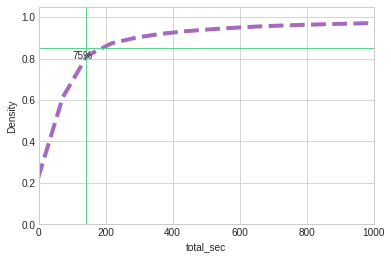

In [266]:
plt.xlim(0,1000)
plt.text(100, 0.8, '75%')
sns.kdeplot(df1_action['total_sec'], cumulative=True, color = '#A569BD', linewidth=4, linestyle='--');
plt.axhline(0.85, linewidth = 1, color = '#58D68D');
plt.axvline(140, linewidth = 1, color = '#58D68D');

plt.show()

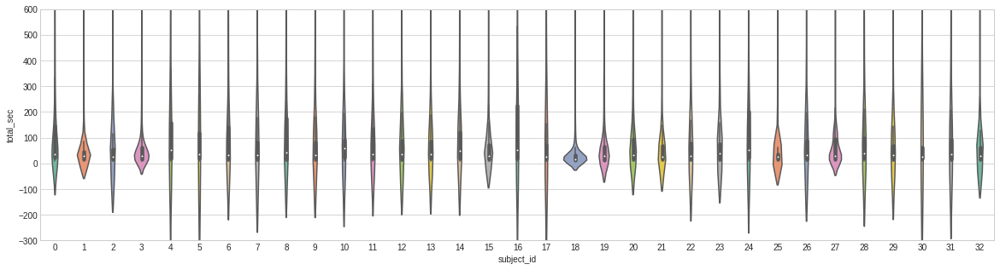

In [267]:
plt.figure(figsize=(20,5))

plt.ylim(-300,600)
sns.violinplot(x = 'subject_id', y='total_sec', data = df1_action.reset_index(), palette="Set2");

plt.show()

In [268]:
top_ap = df1_action.groupby(['genre_bigcol','name'])['total_sec'].agg(['count','mean'])
top_ap['mean'] = top_ap['mean'].map(lambda x: time.strftime('%H:%M:%S', time.gmtime(x)))
top_ap.sort_values('count', ascending=False).head(50).groupby(level=0).head().sort_index(ascending=False)

count      mean
genre_bigcol     name                                 
tools            안드로이드 시스템               973  00:07:57
                 시스템 UI                 1246  00:03:14
                 갤러리                     938  00:00:54
                 TouchWiz 홈             1231  00:02:50
                 Samsung Experience 홈   3914  00:00:48
social           트위터                    1978  00:00:33
                 Melon                   768  00:01:34
                 Instagram              2620  00:01:42
                 Facebook               2566  00:01:16
                 Between                 656  00:00:58
self development 전화                     1383  00:01:52
                 시계                      435  00:02:23
                 Slack                   350  00:00:34
                 ABC Platform           5486  00:02:54
producivity      설정                      281  00:00:59
                 네이버 지도                  220  00:01:13
                 T map                   482  00:03:26
lifestype        캐시워크                   1756  00:03:29
                 기본홈                     724  00:00:53
                 Samsung Pay             382  00:01:02
                 Samsung Health          312  00:05:21
                 Fitbit                 2450  00:05:57
hobby            통화 화면                   531  00:01:06
                 카메라                     563  00:00:29
                 네이버 웹툰                  267  00:01:08
                 NAVER                  2043  00:01:08
                 Google Play 스토어         507  00:00:59
game             소녀전선                    249  00:03:22
                 벽람항로                    265  00:06:20
                 YouTube                1060  00:04:15
                 Harry Potter            273  00:03:31
contact          카카오톡                  11323  00:01:50
                 삼성 인터넷                 3055  00:02:21
                 메시지                    2268  00:04:04
                 T전화                     568  00:01:24
                 Chrome                 3521  00:02:12

In [269]:
top_ap[top_ap['count'] >= 100].sort_values('mean', ascending=False).head(100).groupby(level=0).head().sort_index()

count      mean
genre_bigcol     name                                      
contact          Gmail                        566  00:03:18
                 다음                           188  00:05:07
                 메시지                         2268  00:04:04
                 위챗                           111  00:03:52
                 이메일                          195  00:05:46
game             Harry Potter                 273  00:03:31
                 YouTube                     1060  00:04:15
                 벽람항로                         265  00:06:20
                 위베어베어스 더퍼즐                   104  00:04:41
                 클래시 로얄                       120  00:05:43
hobby            LIVE스코어                      198  00:01:52
                 NAVER                       2043  00:01:08
                 네이버 웹툰                       267  00:01:08
                 위메프                          148  00:01:46
                 티몬                           206  00:01:28
lifestype        Fitbit                      2450  00:05:57
                 Mi 피트                        294  00:12:52
                 Samsung Health               312  00:05:21
                 음악                           196  00:04:06
                 카카오홈                         103  00:05:46
producivity      T map                        482  00:03:26
                 네이버 지도                       220  00:01:13
                 드라이브                         194  00:01:26
                 원터치개인                        106  00:01:30
                 카카오뱅크                        189  00:01:28
self development ABC Platform                5486  00:02:54
                 Slack                        350  00:00:34
                 네이버 사전                       120  00:02:11
                 시계                           435  00:02:23
                 전화                          1383  00:01:52
social           BAND                         273  00:04:23
                 Facebook                    2566  00:01:16
                 Instagram                   2620  00:01:42
                 Melon                        768  00:01:34
                 네이버 카페                       260  00:01:01
tools            AhnLab V3 Mobile Security    120  00:10:25
                 Android 시스템                  259  00:04:39
                 안드로이드 시스템                    973  00:07:57
                 알람/시계                        138  00:03:32
                 알약M                          191  00:05:33

In [277]:
from collections import Counter

app_pt = Counter()
genre_pt = Counter()

a_pat = list(zip(set_df1_action['referrer_app'],set_df1_action['name']))
g_pat = list(zip(set_df1_action['referrer_genre'], set_df1_action['genre']))

app_pt.update(a_pat)
genre_pt.update(g_pat)

In [278]:
app_pt.most_common(100)

[(('Samsung Experience 홈', '카카오톡'), 1253),
 (('카카오톡', '카카오톡'), 1156),
 (('카카오톡', 'Samsung Experience 홈'), 911),
 (('카카오톡', 'Chrome'), 781),
 (('카카오톡', 'ABC Platform'), 769),
 (('카카오톡', 'Facebook'), 713),
 (('ABC Platform', '카카오톡'), 611),
 (('카카오톡', '삼성 인터넷'), 556),
 (('Chrome', '카카오톡'), 535),
 (('Samsung Experience 홈', 'ABC Platform'), 526),
 (('캐시워크', '캐시워크'), 513),
 (('캐시워크', '카카오톡'), 504),
 (('Facebook', '카카오톡'), 495),
 (('카카오톡', 'Instagram'), 482),
 (('Samsung Experience 홈', 'Instagram'), 425),
 (('트위터', '트위터'), 413),
 (('Samsung Experience 홈', 'Samsung Experience 홈'), 410),
 (('Samsung Experience 홈', 'NAVER'), 373),
 (('Samsung Experience 홈', 'Facebook'), 350),
 (('카카오톡', 'NAVER'), 340),
 (('카카오톡', '메시지'), 339),
 (('캐시워크', '삼성 인터넷'), 336),
 (('삼성 인터넷', '카카오톡'), 323),
 (('트위터', '카카오톡'), 323),
 (('메시지', '카카오톡'), 294),
 (('NAVER', '카카오톡'), 294),
 (('Samsung Experience 홈', '삼성 인터넷'), 287),
 (('안드로이드 시스템', '카카오톡'), 283),
 (('카카오톡', 'Fitbit'), 269),
 (('캐시워크', 'ABC Platform'), 261),
 ((

In [279]:
genre_pt.most_common(20)

[(('Communication', 'Communication'), 6524),
 (('Tools', 'Communication'), 3951),
 (('Social', 'Communication'), 2893),
 (('Communication', 'Social'), 2784),
 (('Communication', 'Tools'), 2514),
 (('Tools', 'Tools'), 1984),
 (('Health & Fitness', 'Communication'), 1959),
 (('Tools', 'Social'), 1743),
 (('Social', 'Social'), 1656),
 (('Communication', 'Educational'), 1515),
 (('Personalization', 'Communication'), 1372),
 (('Communication', 'Health & Fitness'), 1318),
 (('Educational', 'Communication'), 1166),
 (('Lifestyle', 'Communication'), 1108),
 (('Tools', 'Educational'), 1088),
 (('Social', 'Tools'), 1083),
 (('Communication', 'Personalization'), 903),
 (('Health & Fitness', 'Health & Fitness'), 868),
 (('Education', 'Communication'), 823),
 (('Communication', 'Education'), 809)]

In [280]:
genre_pt_1000 = genre_pt.most_common(1000)

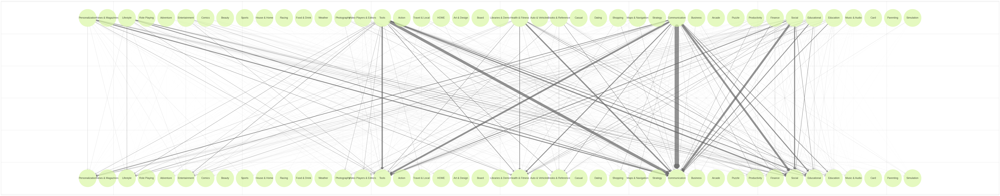

In [282]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(125,25))

G1_keys = set([k[0] for k, _ in genre_pt_1000 if all(k) is True])
G2_keys = set([k[1] for k, _ in genre_pt_1000 if all(k) is True])
G_keys = G1_keys.union(G2_keys)
num_keys = len(G_keys)
G_mapping = {k: v for v, k in enumerate(G_keys)}
G_rev_mapping = {k: v for k, v in enumerate(G_keys)}

edge_list = []
for edge, weight in genre_pt_1000:
    if all(edge) is False: continue
    mapped_edge = (G_mapping[edge[0]], G_mapping[edge[1]] + num_keys, weight)
    edge_list.append(mapped_edge)

node_labels = {k: v for k, v in G_rev_mapping.items()}
node_labels.update({k + num_keys: v for k, v in G_rev_mapping.items()})

DG = nx.DiGraph()

DG.add_weighted_edges_from(edge_list)
DG.add_nodes_from([k for k in G_rev_mapping.keys()])

pos = {}
for node in node_labels.keys():
    x_spacing = np.linspace(-0.8, 0.8, num_keys)
    x = x_spacing[node] if node < num_keys else x_spacing[node - num_keys]
    y = 0.5 if node < num_keys else -0.5
    pos[node] = (x, y)

edge_width = [DG[u][v]['weight'] for u, v in DG.edges()]
normalized_edge_width = [30 * width / max(edge_width) for width in edge_width]

# plt.figure(1, figsize=(24, 8))
graph = nx.draw_networkx(DG, pos,
                         alpha=0.7,
                         with_labels=True, width=normalized_edge_width,
                         edge_color='.4', node_color = '#DAF7A6', node_size=15000, labels=node_labels, font_size = 18,
                         arrowstyle='->,head_width=0.6,head_length=0.5')

In [283]:
app_pt_100 = app_pt.most_common(100)

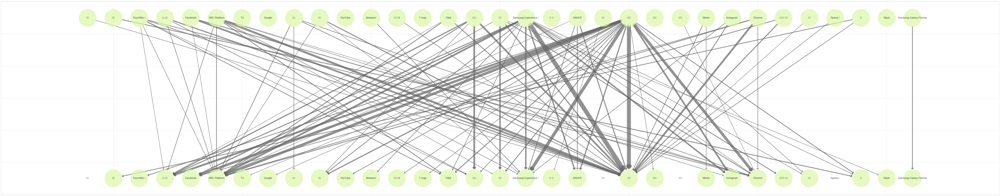

In [284]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(125,25))

G1_keys = set([k[0] for k, _ in app_pt_100 if all(k) is True])
G2_keys = set([k[1] for k, _ in app_pt_100 if all(k) is True])
G_keys = G1_keys.union(G2_keys)
num_keys = len(G_keys)
G_mapping = {k: v for v, k in enumerate(G_keys)}
G_rev_mapping = {k: v for k, v in enumerate(G_keys)}

edge_list = []
for edge, weight in app_pt_100:
    if all(edge) is False: continue
    mapped_edge = (G_mapping[edge[0]], G_mapping[edge[1]] + num_keys, weight)
    edge_list.append(mapped_edge)

node_labels = {k: v for k, v in G_rev_mapping.items()}
node_labels.update({k + num_keys: v for k, v in G_rev_mapping.items()})

DG = nx.DiGraph()

DG.add_weighted_edges_from(edge_list)
DG.add_nodes_from([k for k in G_rev_mapping.keys()])

pos = {}
for node in node_labels.keys():
    x_spacing = np.linspace(-0.8, 0.8, num_keys)
    x = x_spacing[node] if node < num_keys else x_spacing[node - num_keys]
    y = 0.5 if node < num_keys else -0.5
    pos[node] = (x, y)

edge_width = [DG[u][v]['weight'] for u, v in DG.edges()]
normalized_edge_width = [30 * width / max(edge_width) for width in edge_width]

# plt.figure(1, figsize=(24, 8))
graph = nx.draw_networkx(DG, pos,
                         alpha=0.7,
                         with_labels=True, width=normalized_edge_width,
                         edge_color='.4', node_color = '#DAF7A6', node_size=15000, labels=node_labels, font_size = 18,
                         arrowstyle='->,head_width=0.6,head_length=0.5')